In [64]:
# pip install numpy pandas tensorflow matplotlib librosa soundfile

The following work in this notebook is done by Vishesh Malik

### Load Libraries

In [2]:
import json
import os
import librosa
import numpy as np
import itertools
import matplotlib.pyplot as plt
import tensorflow as tf
import random
from IPython.display import Audio
import soundfile as sf
import pickle

### Load The Dataset in JSON Format

In [3]:
# Train
with open('/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/examples.json','r') as file: # CHANGE
    examples_train = json.load(file)

# Validation
with open('/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-valid/examples.json','r') as file: # CHANGE
    examples_valid = json.load(file)

In [4]:
def store_songs(examples):
    
    dict_of_instruments = {}
    
    for song in examples:
        instrument = examples[song]['instrument_family_str']
        pitch_range = examples[song]['pitch']
        
        if examples[song]['instrument_source_str'] == 'acoustic':
            if 24 <= pitch_range <= 84:   # 24 - 84 hz range
                
                if instrument not in dict_of_instruments:
                    dict_of_instruments[instrument] = []
                    
                dict_of_instruments[instrument].append(song)
                
    return dict_of_instruments

### Creating 'instrument' Specific Directories and Arrays for Train and Valid Sets.

In [5]:
# TRAIN
dict_of_songs_train = store_songs(examples_train)

# Take 'x' songs for each instrument
selected_songs_train = []
x = 1000
for key, songs in dict_of_songs_train.items():
    random.shuffle(songs)   # Shuffle songs for each key
    
    if key == 'guitar':        # ['guitar', 'organ', 'keyboard', 'bass', 'vocal', 'string', 'reed', 'flute', 'mallet', 'brass', 'synth_lead']
        selected_songs_train.extend(songs[:x])  # CHANGE
    
# Creating directories to load the 'Train' data
songs_path_train = [f'/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/{song}.wav' for song in selected_songs_train]  # CHANGE

In [6]:
# VALID
dict_of_songs_valid = store_songs(examples_valid)

# Take 'x' number of songs for each instrument
selected_songs_valid = []
x = 100
for key, songs in dict_of_songs_valid.items():
    random.shuffle(songs)   # Shuffle songs for each key
    
    if key == 'guitar':      # ['guitar', 'organ', 'keyboard', 'bass', 'vocal', 'string', 'reed', 'flute', 'mallet', 'brass', 'synth_lead']
        selected_songs_valid.extend(songs[:x])  # CHANGE 

# Creating directories to load the 'Valid' data        
songs_path_valid = [f'/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-valid/audio/{song}.wav' for song in selected_songs_valid]  # CHANGE

In [70]:
# for e in songs_path_train:
#     print(e)

### Printing the Number of Audio Files for Each Instrument (Train and Valid)

In [7]:
# TRAIN
for instrument, songs in dict_of_songs_train.items():
    print(f"{instrument}: {len(songs)}")
    
total_len = sum(len(songs) for songs in dict_of_songs_train.values())
print("Total len of list_of_songs_train = ", total_len)
print()


# VALID
for instrument, songs in dict_of_songs_valid.items():
    print(f"{instrument}: {len(songs)}")

total_len = sum(len(songs) for songs in dict_of_songs_valid.values())
print("Total len of list_of_songs_valid = ", total_len)

guitar: 8350
keyboard: 5676
string: 16990
reed: 11333
flute: 4207
brass: 11985
mallet: 18735
vocal: 3820
organ: 158
bass: 200
Total len of list_of_songs_train =  81454

keyboard: 210
mallet: 403
brass: 769
guitar: 1029
reed: 663
string: 768
vocal: 83
flute: 68
Total len of list_of_songs_valid =  3993


### Loading Audio Data

-We load the audio data from `songs_path_train` and `songs_path_valid` file paths provided for both the training and validation datasets, respectively. The `librosa` library is used to read the audio files. 

-We also handle potential exceptions to ensure that any errors during the loading process are caught and reported.

In [8]:
audio_data_train = {}

for path in songs_path_train:
    try:
        y,sr = librosa.load(path,sr=None)
        
        audio_data_train[path] = {'audio':y,
                                  'sample_rate':sr
                                }
        # print(path)
    except Exception as e:
        print(f"Error loading {path}: {e}")

In [9]:
audio_data_valid = {}

for path in songs_path_valid:
    try:
        y,sr = librosa.load(path,sr=None)
        audio_data_valid[path] = {'audio':y,
                                  'sample_rate':sr
                                 }
        # print(path)
    except Exception as e:
        print(f"Error loading {path}: {e}")

In [ ]:
def plot_magnitude_spectrogram(audio_data_train):
    count=0
    
    for path, data in audio_data_train.items():
        
        if count >= 10:
            break
        
        y = data['audio']
        sr = data['sample_rate']
        path = path.split('/')[8]

        # Convert audio to tensor
        audio_tensor = tf.convert_to_tensor(y, dtype=tf.float32)

        # Compute the STFT using TensorFlow
        stft_tensor = tf.signal.stft(audio_tensor, frame_length=1024, frame_step=256)
        magnitude_spectrogram = tf.abs(stft_tensor)

        # Convert TensorFlow tensor to numpy array
        magnitude_spectrogram_np = magnitude_spectrogram.numpy()

        # Convert amplitude to decibels using librosa
        S_db = librosa.amplitude_to_db(magnitude_spectrogram_np, ref=np.max)

        # Plot the magnitude spectrogram
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(S_db.T, sr=sr, hop_length=256, x_axis='time', y_axis='log')

        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Magnitude Spectrogram of {path}')
        plt.xlabel('Time')
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
        count+=1

# Example usage
plot_magnitude_spectrogram(audio_data_train)


Check song name with sample rate and audio length

In [130]:

i = 0
for key, value in audio_data_train.items():
    file_name = selected_songs_train[i]
    y = value['audio']
    sample_rate = value['sample_rate']
    i = i + 1
    
    print(f"File: {file_name}, Sample Rate: {sample_rate}, Audio Length: {len(y)}")
    
# for song_path, data in list(audio_data.items())[:5]:
#     print(f"File: {song_path}, Sample Rate: {data['sample_rate']}, Audio Length: {len(data['audio'])}")

File: guitar_acoustic_019-067-075, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_020-035-127, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_033-037-050, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_005-034-100, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_017-044-127, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_004-070-025, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_004-034-025, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_013-056-050, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_009-037-050, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_024-067-075, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_034-072-050, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_032-038-127, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_003-031-075, Sample Rate: 16000, Audio Length: 64000
File: guitar_acoustic_026

### Compute Spectrograms(Pre-processing)

In [12]:
def compute_spectogram(audio):
    spectrogram = tf.signal.stft(audio, frame_length = 1024, frame_step = 256)  # nfft = frame size, hop_length = stride
    spectrogram = spectrogram[:, :-1]  # Trim the Nyquist frequency (last frequency bin)
    
    # Magnitude
    magnitude = tf.abs(spectrogram)
    magnitude_log = tf.math.log1p(magnitude)
    # magnitude_normalize = 2 * ((magnitude_log - np.min(magnitude_log)) / (np.max(magnitude_log) - np.min(magnitude_log))) - 1
    magnitude_normalize = 2 * ((magnitude_log) / tf.reduce_max(magnitude_log)) - 1
    
    # Phase
    phase = tf.math.angle(spectrogram)
    # phase_normalize = 2 * ((phase - np.min(phase)) / (np.max(phase) - np.min(phase))) - 1
    phase_normalize = 2 * (phase / np.pi) - 1
    
    final_spectrogram = tf.stack([magnitude_normalize, phase_normalize], axis = -1)
    
    pad_width = 256 - final_spectrogram.shape[0] # Pad the tensor i.e to have 256 instead of 247 shape 
    final_spectrogram = tf.pad(final_spectrogram, [[0, pad_width],[0,0],[0,0]])
        
    return final_spectrogram.numpy()

In [13]:
# Compute spectrograms for TRAINING set
spectogram_list_train = [compute_spectogram(value['audio']) for key, value in audio_data_train.items()]
print([key for key, _ in itertools.islice(audio_data_train.items(),10)])  # printing directories of the audio clips for confirmation of existence
print()

# Compute spectrograms for VALIDATION set
spectogram_list_valid = [compute_spectogram(value['audio']) for key, value in audio_data_valid.items()]
print([key for key, _ in itertools.islice(audio_data_valid.items(),10)])  # printing directories of the audio clips for confirmation of existence

['/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_036-070-050.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_035-062-025.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_034-058-050.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_000-071-050.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_018-052-100.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_001-082-025.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_009-047-050.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_024-081-050.wav', '/Users/visheshmalik/Downloads/Applied AI Project/JSON:Wav/nsynth-train/audio/guitar_acoustic_006-084-0

In [14]:
print(len(spectogram_list_train))
print(len(spectogram_list_valid))

1000
100


Printing the shape of each spectrogram from `spectogram_list_train` and `spectogram_list_valid` set; should be 256x512x2.

In [78]:
# for e in spectogram_list_train[:100]:
#     print(e.shape)

In [79]:
# for e in spectogram_list_valid[:100]:
#     print(e.shape)

In [80]:
# the_list = [ key for key, _ in itertools.islice(audio_data_train.items(),10)]
# for e in the_list:
#     print(e)
#     print()

### Plot Spectrogram

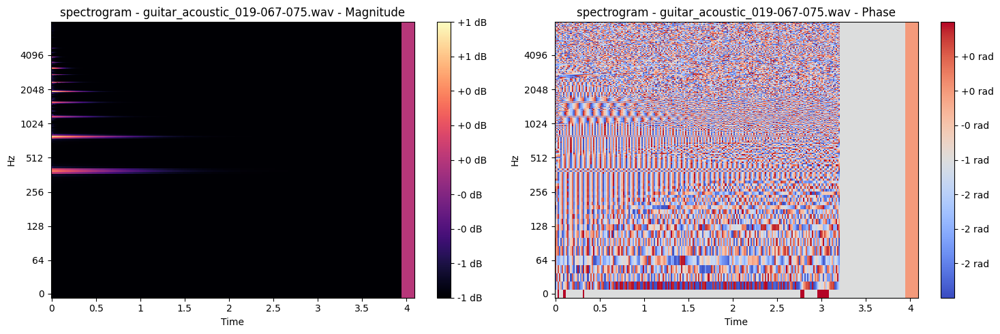

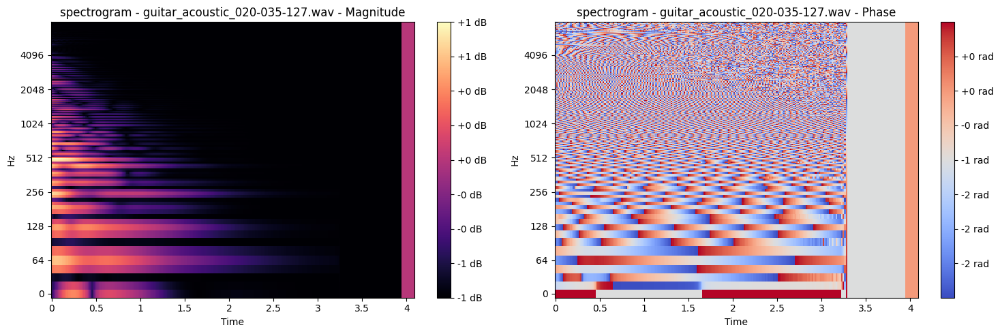

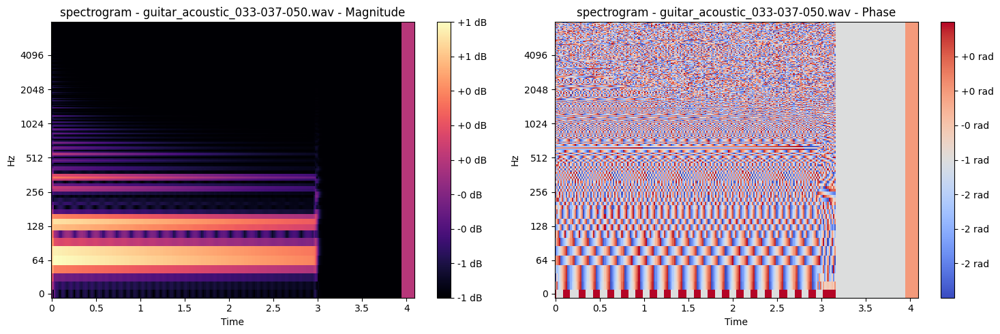

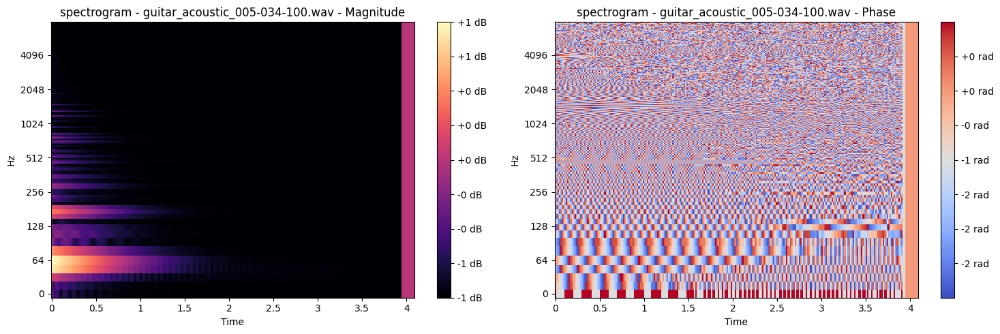

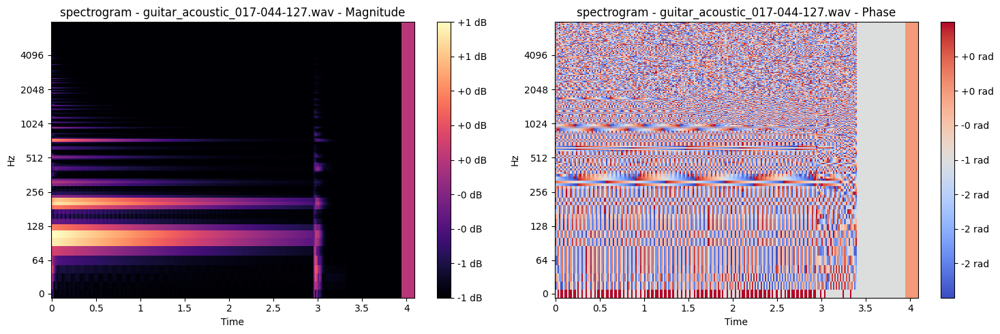

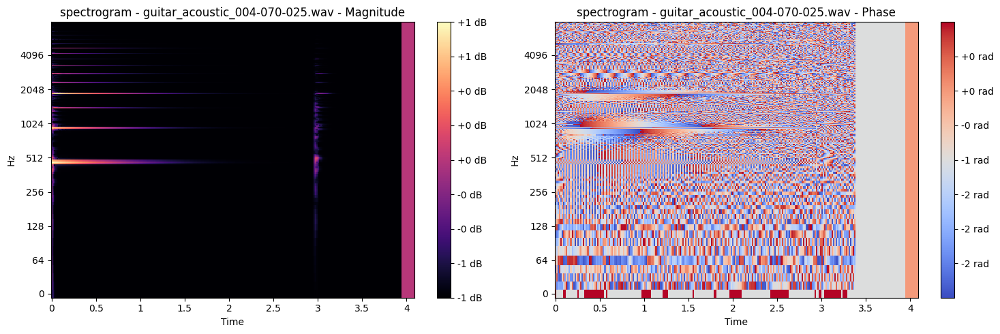

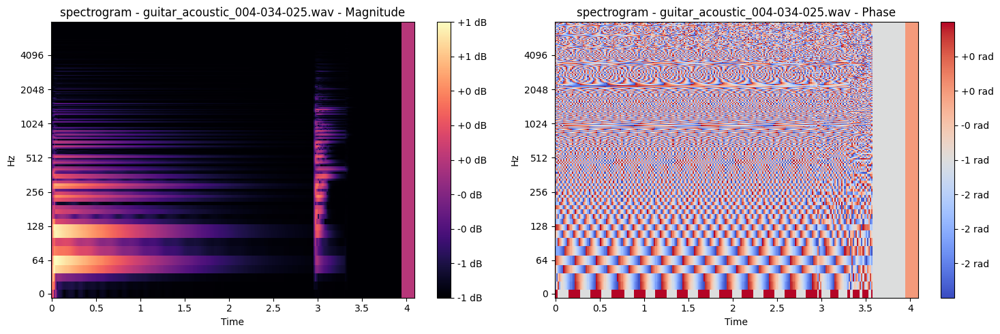

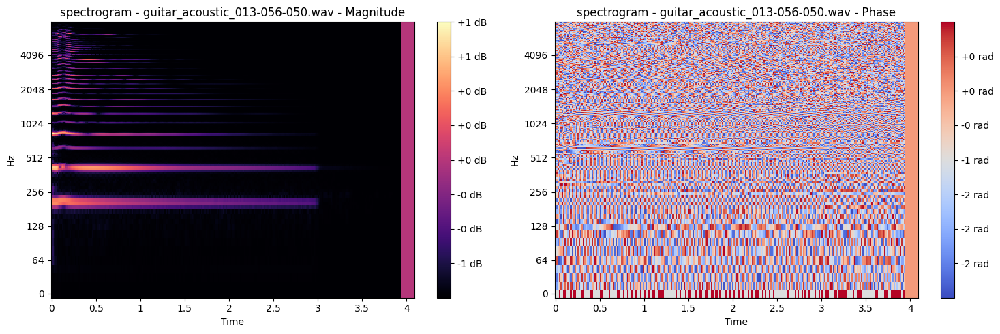

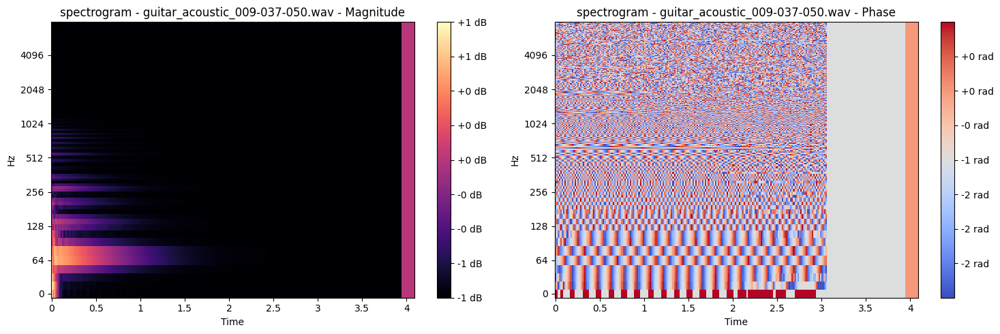

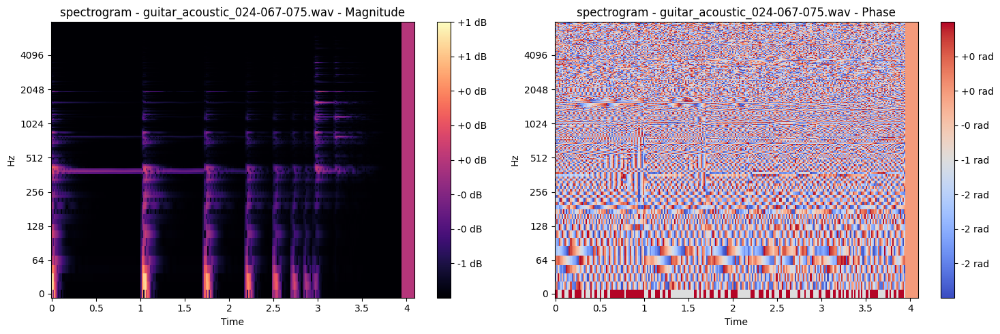

In [131]:
def plot_spectrogram(spectrogram, title, i):
    
    title = title.split('/')[8]
    plt.figure(figsize=(15, 5))
    
    # Plot magnitude
    magnitude = spectrogram[:, :, 0]
    plt.subplot(1, 2, 1)
    librosa.display.specshow(magnitude.T, sr=16000, hop_length=256, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"spectrogram - {title} - Magnitude")
    
    # Plot phase
    phase = spectrogram[:, :, 1]
    plt.subplot(1, 2, 2)
    librosa.display.specshow(phase.T, sr=16000, hop_length=256, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f rad')
    plt.title(f"spectrogram - {title} - Phase")
    
    plt.tight_layout()
    plt.show()

# Plot the first 10 spectrograms (Train)
for i, (key, _) in enumerate(itertools.islice(audio_data_train.items(), 10)):
    plot_spectrogram(spectogram_list_train[i], key, i)

### Create sequences for the Training and Validation Set
- Function `create_sequences` takes a list of spectrograms and a sequence length `seq_len` as inputs and returns an array of sequences for training and validation sets.

In [15]:
def create_sequences(spectrogram_list, seq_len):
    
    seq = []
    for i in range(len(spectrogram_list)  - seq_len):
      seq.append(spectogram_list_train[i : i + seq_len])  
    
    return np.array(seq)

In [16]:
# TRAIN
sequence_array_train = create_sequences(spectogram_list_train, seq_len = 16)
print('sequence_array_train = ',sequence_array_train.shape)

X_train = sequence_array_train[:, :-1]
Y_train = sequence_array_train[:,-1]

print('X_train shape: ',X_train.shape)
print('Y_train shape: ',Y_train.shape)

sequence_array_train =  (984, 16, 256, 512, 2)
X_train shape:  (984, 15, 256, 512, 2)
Y_train shape:  (984, 256, 512, 2)


In [17]:
# VALID
sequence_array_valid = create_sequences(spectogram_list_valid, seq_len = 16)
print('sequence_array_valid = ',sequence_array_valid.shape)

X_Valid = sequence_array_valid[:, :-1]
Y_Valid = sequence_array_valid[:,-1]

print('X_Valid shape: ',X_Valid.shape)
print('Y_Valid shape: ',Y_Valid.shape)

sequence_array_valid =  (84, 16, 256, 512, 2)
X_Valid shape:  (84, 15, 256, 512, 2)
Y_Valid shape:  (84, 256, 512, 2)


### Build LSTM Model
The model includes:
- `Time Distributed` Flatten Layer which flattens each spectrogram frame within the sequence, converting the 2D or 3D array into a 1D array, allowing it to be processed by the LSTM layers.
- The model includes five `Bidirectional` LSTM layers, each with 128 LSTM units. The bidirectional nature of these layers allows the model to learn temporal dependencies in both forward and backward directions. 
- To prevent overfitting, `dropout` layers are included with a rate of 0.2 (20%) after each LSTM layer by randomly dropping a fraction of the units at the time of training. 
- A `dense` layer is used to map the LSTM outputs to the desired output shape. 
- Finally, the final output is `reshaped` to have the size of the original spectrogram dimensions (256, 512, 2). 

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Input, Dense, Flatten, TimeDistributed, Reshape, Bidirectional

def LSTM_model(input_shape, output_shape):
    
    Model = Sequential()
    Model.add(Input(shape = input_shape)) # I/P layer
    Model.add(TimeDistributed(Flatten())) # Flattening the 2-D or 3D array to 1D

    # Add LSTM layers with dropout
    Model.add(Bidirectional(LSTM(128,return_sequences = True)))
    Model.add(Dropout(0.2))
    
    Model.add(Bidirectional(LSTM(128,return_sequences = True)))
    Model.add(Dropout(0.2))
    
    Model.add(Bidirectional(LSTM(128,return_sequences = True)))
    Model.add(Dropout(0.2))
    
    Model.add(Bidirectional(LSTM(128,return_sequences = True)))
    Model.add(Dropout(0.2))
    
    Model.add(Bidirectional(LSTM(128,return_sequences = False)))
    Model.add(Dropout(0.2))

    Model.add(Dense(output_shape[0] * output_shape[1] * output_shape[2])) # 256 * 512 * 2 = 262144
    Model.add(Reshape(output_shape))
    
    return Model

seq_len = 16
input_shape = (seq_len, 256, 512, 2)
output_shape = (256, 512, 2)

In [24]:
model_lstm = LSTM_model(input_shape, output_shape)
model_lstm.compile(optimizer = 'Adam', loss ='mse', metrics=['mae'])
model_lstm.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed                │ (None, 16, 262144)     │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 16, 256)        │   268,567,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 16, 256)        │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 16, 256)        │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 16, 256)        │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 16, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_4 (Bidirectional) │ (None, 256)            │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 262144)         │    67,371,008 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 256, 512, 2)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337,515,520 (1.26 GB)

 Trainable params: 337,515,520 (1.26 GB)

 Non-trainable params: 0 (0.00 B)

In [25]:
history = model_lstm.fit(X_train, Y_train, epochs = 50, validation_data = (X_Valid, Y_Valid), batch_size = 32, verbose = 1)

Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 299s 9s/step - loss: 0.9887 - mae: 0.8030 - val_loss: 0.4852 - val_mae: 0.4460
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 235s 7s/step - loss: 0.4573 - mae: 0.3916 - val_loss: 0.4649 - val_mae: 0.3717
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 242s 8s/step - loss: 0.4568 - mae: 0.3708 - val_loss: 0.4640 - val_mae: 0.3624
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 269s 8s/step - loss: 0.4460 - mae: 0.3608 - val_loss: 0.4647 - val_mae: 0.3613
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 245s 8s/step - loss: 0.4518 - mae: 0.3645 - val_loss: 0.4639 - val_mae: 0.3593
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 270s 8s/step - loss: 0.4649 - mae: 0.3742 - val_loss: 0.4637 - val_mae: 0.3591
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 289s 9s/step - loss: 0.4477 - mae: 0.3610 - val_loss: 0.4637 - val_mae: 0.3640
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 284s 9s/step - loss: 0.4549 - mae: 0.3659 - val_loss: 0.4644 - val_mae: 0.3621
Epoch 9/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 276s 9s/step - loss: 0.454

### Save the Model
1. Put Instrument Name,  eg. history_guitar.pkl

In [26]:
# Save the model
model_lstm.save('Bi_lstm_model_mallet.keras')

# Save the history object
with open('Bi_history_mallet.pkl','wb') as file: # PUT Instrument name, eg. history_guitar.pkl
    pickle.dump(history.history, file)

### Load Model
1. Put Instrument Name,  eg. lstm_model_guitar.keras

In [18]:
from tensorflow.keras.models import load_model

# Load model
model_lstm = load_model('Bi_lstm_model_guitar.keras')

# Load history
with open('Bi_history_guitar.pkl','rb') as file:
    history = pickle.load(file)

In [19]:
loss, mae = model_lstm.evaluate(X_Valid, Y_Valid)

print('Validation loss = ', loss)
print('MAE = ', mae)

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 996ms/step - loss: 0.5493 - mae: 0.4285
Validation loss =  0.5439556837081909
MAE =  0.42472901940345764


### Plotting Loss Plots

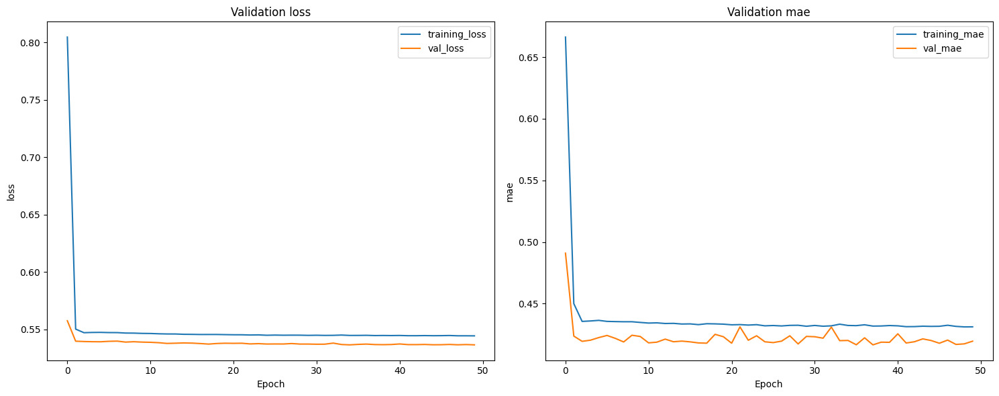

In [20]:
# Plot the loss plots
plt.figure(figsize = (15,6))

plt.subplot(1,2,1)
plt.title('Validation loss')
plt.plot(history['loss'], label = 'training_loss')
plt.plot(history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend()


plt.subplot(1,2,2)
plt.title('Validation mae')
plt.plot(history['mae'], label = 'training_mae')
plt.plot(history['val_mae'], label = 'val_mae')
plt.xlabel('Epoch')
plt.ylabel('mae')
plt.legend()

plt.tight_layout()
plt.show()

In [21]:
seed_sequence1 = X_Valid[1]   # shape = (15, 256, 512, 2)
seed_sequence2 = X_Valid[2]
seed_sequence = X_Valid[1]

extra_frames = 5
generated_music = []

In [22]:
print(seed_sequence.shape)

(15, 256, 512, 2)


In [49]:
# def interpolate_sequences(seq_1, seq_2, no_of_steps):
#     interpolated_sequences = []
    
#     for alpha in np.linspace(0, 1, no_of_steps):
#         interpolate_seq = (1 - alpha) * seq_1 + alpha * seq_2
#         interpolated_sequences.append(interpolate_seq)
        
#     return interpolated_sequences

# interpolated_sequences = interpolate_sequences(seed_sequence1, seed_sequence2, 5)

### Generating Music with the LSTM Model

- The `generate_music` function takes a trained instrument-specific `model_lstm`, `seed sequence`, and `extra_frames` to generate as inputs. It then iteratively predicts and appends new frames to the sequence using the model.

In [23]:
def generate_music(model_lstm, seed_sequence, extra_frames):
    
    generated_seq = seed_sequence.copy()
    seq_len = seed_sequence.shape[0]
    
    for _ in range(extra_frames):
        
        next_frame = model_lstm.predict(np.expand_dims(generated_seq[-seq_len:], axis=0)) # shape changes from (seq_len, 256, 512, 2) 
                                                                                          # to (1, seq_len, 256, 512, 2)        
        generated_seq = np.concatenate([generated_seq, next_frame], axis=0)
    
    return generated_seq

# for i in interpolated_sequences:
#     generated_each_sequence = generate_music(model_lstm, i, extra_frames) # i = current interpolated sequence
#     generated_music.append(generated_each_sequence)

music_audio = generate_music(model_lstm, seed_sequence, extra_frames)
print('Generated music audio shape =', music_audio.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
Generated music audio shape = (20, 256, 512, 2)


### Post Processing

- Under post-processing, `spectrogram_to_audio` just converts the generated spectrogram back into audio for further evaluation.

In [24]:
def spectrogram_to_audio(spectrogram):
    magnitude = spectrogram[:, :, 0]
    phase = spectrogram[:, :, 1]
    
    # De-normalize the magnitude correctly
    magnitude = (magnitude + 1) / 2 * np.max(magnitude)
    
    # Convert to NumPy array for librosa
    magnitude_np = magnitude.numpy() if isinstance(magnitude, tf.Tensor) else magnitude
    
    # Reconstruct the complex-valued spectrogram (real + imaginary)
    complex_spectrogram = magnitude_np * np.exp(1j * phase * np.pi)
    
    # Inverse STFT using librosa
    audio = librosa.istft(complex_spectrogram)
    
    return audio

Plotting Waveform and Spectrogram for Visualization

In [25]:
def plot_waveform_and_spectrogram(audio, title):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(2, 1, 1)
    plt.title(f'{title} - Waveform')
    librosa.display.waveshow(audio, sr=16000)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    
    plt.subplot(2, 1, 2)
    plt.title(f'{title} - Spectrogram')
    D = librosa.amplitude_to_db(np.abs(librosa.stft(audio)), ref=np.max)
    librosa.display.specshow(D, sr=16000, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

Approach 1 - Converts each frame of the spectrogram into audio individually and then concatenates the resulting audio clips

In [26]:
# ORIGINAL
# Getting back original audio from `seed_sequence`
generated_audio = [spectrogram_to_audio(frame) for frame in seed_sequence]
original_combined_audio_appr_1 = np.concatenate(generated_audio, axis=0)
print('Play original_audio:')
display(Audio(original_combined_audio_appr_1,rate=16000))  # Play the audio
original_audio_appr_1 = spectrogram_to_audio(seed_sequence)


# GENERATED
# Convert the generated spectrograms to audio
generated_audio = [spectrogram_to_audio(frame) for frame in music_audio[seed_sequence.shape[0]:]]   #[seed_sequence.shape[0]:]

# Combine the audio frames into a single audio clip
combined_audio_appr_1 = np.concatenate(generated_audio, axis=0)
print('Play generated_audio:')
display(Audio(combined_audio_appr_1,rate=16000))

Play original_audio:


Play generated_audio:


Approach 2 - Concatenates all the frames of the spectrogram into a single large spectrogram and then converts this combined spectrogram into audio.

In [27]:
print(np.array(music_audio).shape)

#ORIGINAL
# Select a single frame from the seed sequence for testing
seed_frame_original = np.concatenate(seed_sequence, axis=0)

# Convert the spectrogram to audio
original_audio_appr_2 = spectrogram_to_audio(seed_frame_original)
print('Play original Audio')  # Play the audio
display(Audio(original_audio_appr_2, rate=16000))

#GENERATED
# Combine Spectrogram Frames into one large spectrogram
seed_frame = np.concatenate(music_audio[seed_sequence.shape[0]:], axis=0)

# Convert the spectrogram to audio
audio = spectrogram_to_audio(seed_frame)
print('Play predicted Audio')  # Play the audio
display(Audio(audio, rate=16000))



#INTERPOLATION
# combined_spectrogram = np.concatenate([frame for seq in generated_music for frame in seq], axis=0)
# print(combined_spectrogram.shape)
# # Convert the spectrogram to audio
# audio = spectrogram_to_audio(combined_spectrogram)
# print('Play predicted Audio')  # Play the audio
# display(Audio(audio, rate=16000))


(20, 256, 512, 2)
Play original Audio


Play predicted Audio


In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Evaluate the generated music
predicted_frames = music_audio[-extra_frames:]
true_frames = Y_Valid[:extra_frames]

mse = mean_squared_error(true_frames.flatten(), predicted_frames.flatten())
mae = mean_absolute_error(true_frames.flatten(), predicted_frames.flatten())

print(f'MSE: {mse}')
print(f'MAE: {mae}')

MSE: 0.5596017241477966
MAE: 0.43446817994117737


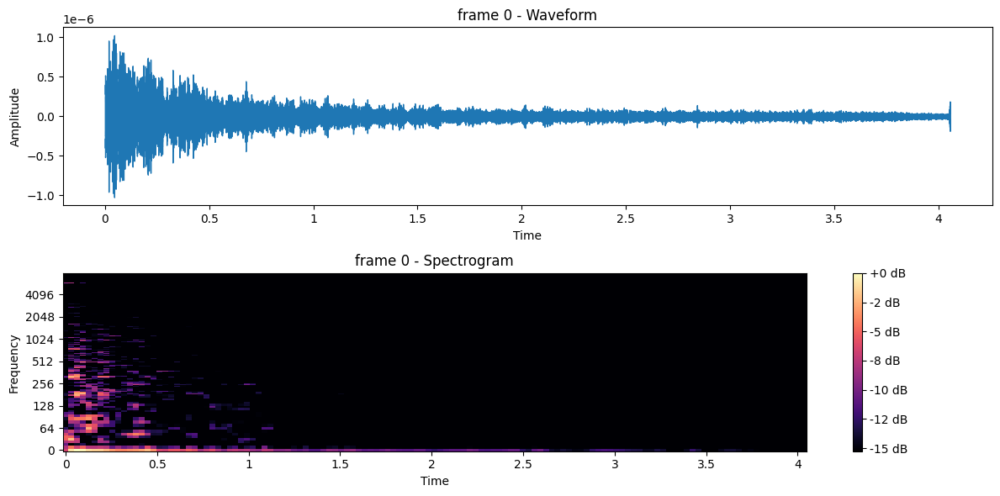

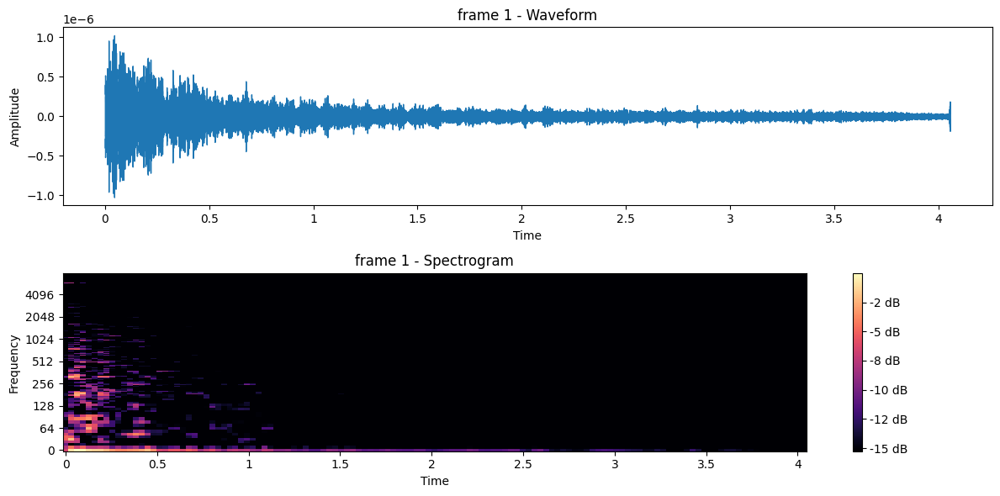

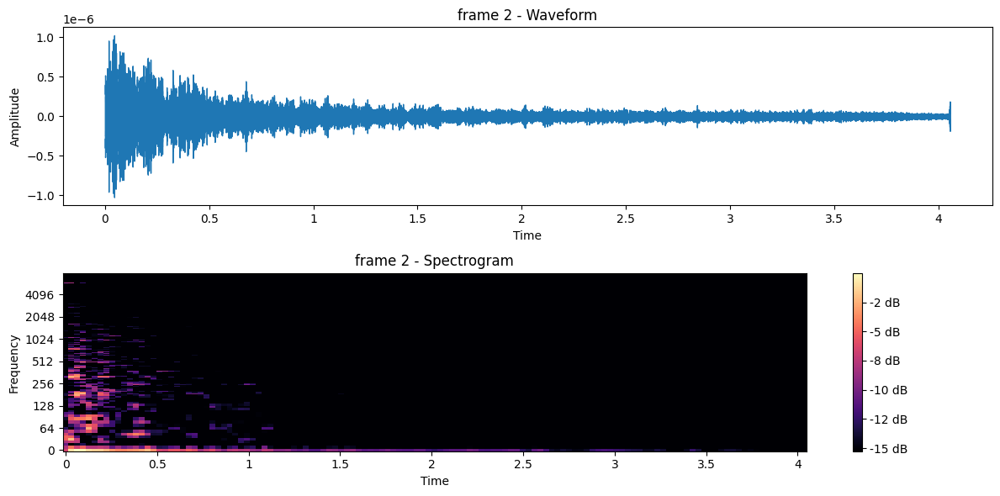

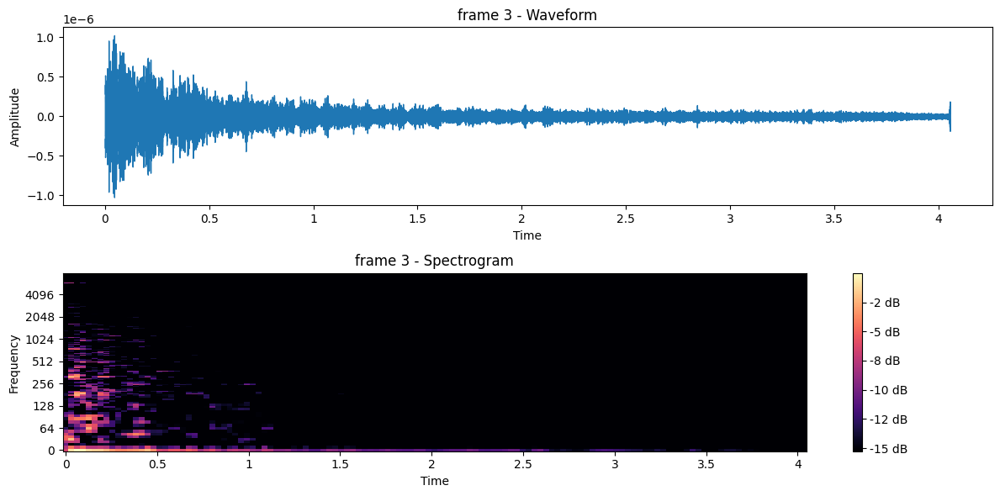

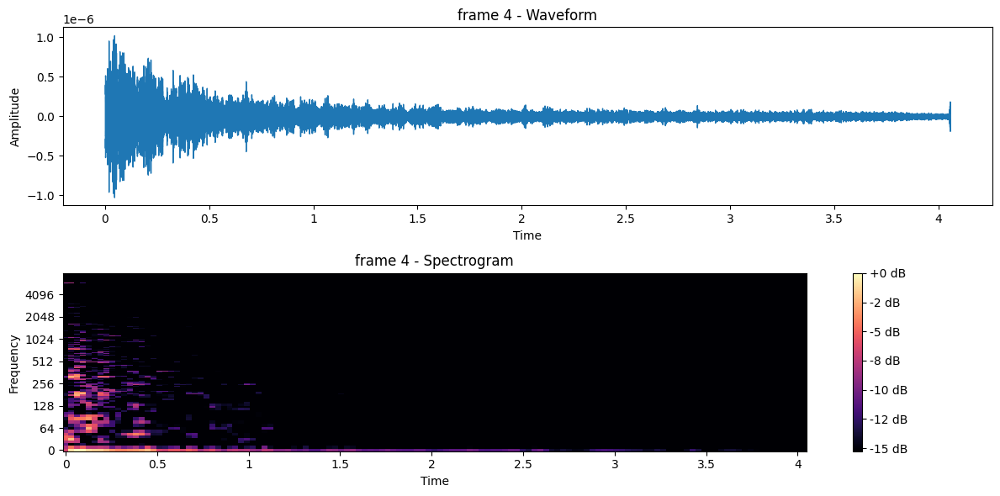

Original :


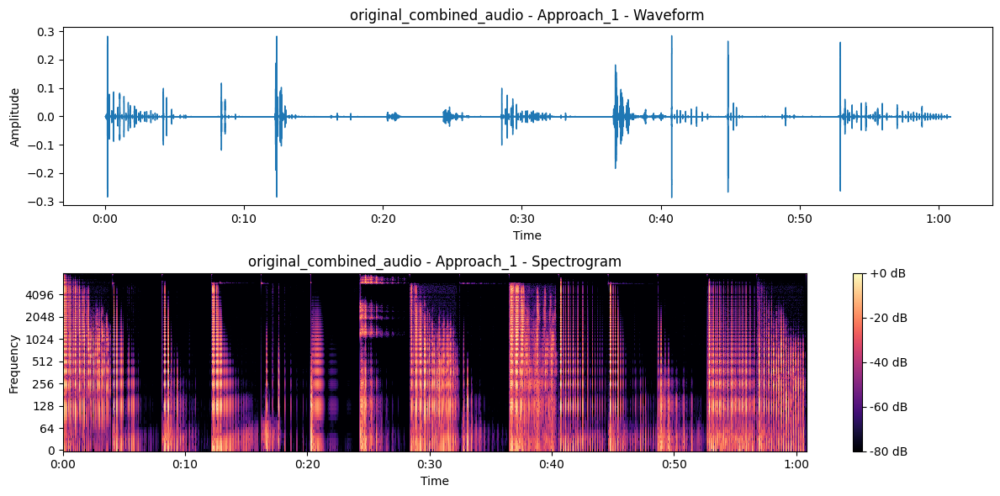

Generated :


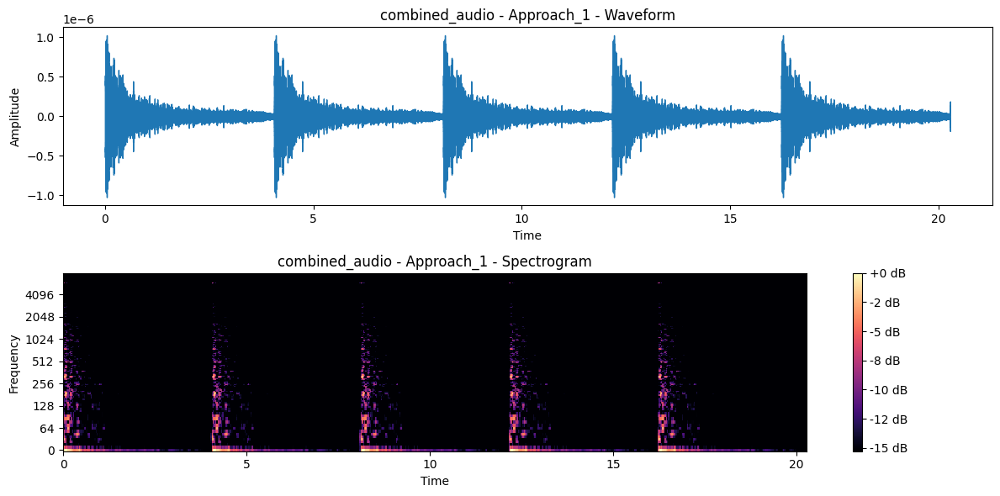

In [29]:
# APPROACH 1

# Plot each frame of the audio
for i, value in enumerate(generated_audio):
    plot_waveform_and_spectrogram(value, f'frame {i}')

# Plot whole audio
print('Original :')
plot_waveform_and_spectrogram(original_combined_audio_appr_1,'original_combined_audio - Approach_1')
print('Generated :')
plot_waveform_and_spectrogram(combined_audio_appr_1,'combined_audio - Approach_1')


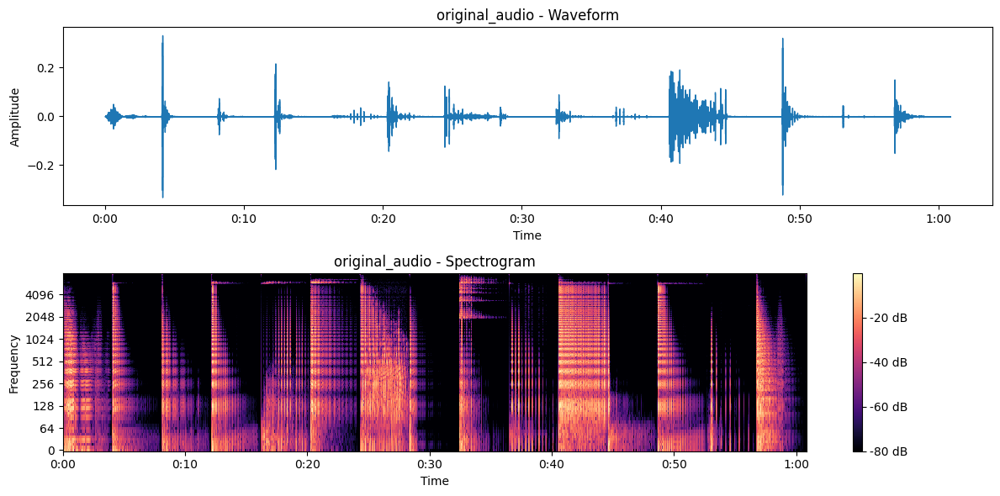

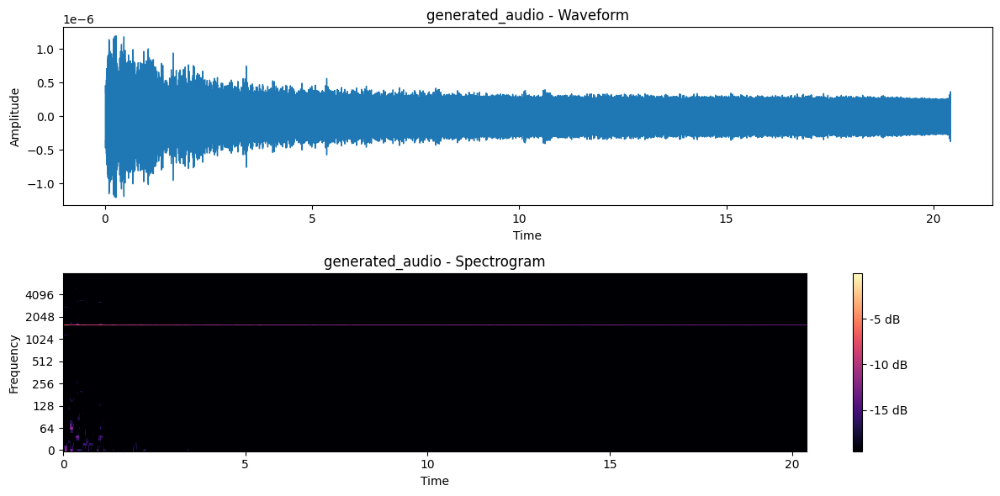

In [122]:
# APPROACH 2

plot_waveform_and_spectrogram(original_combined_audio_appr_1,'original_audio')
plot_waveform_and_spectrogram(audio,'generated_audio')

### Save Audio Files Locally

In [1]:
sf.write('sample1.wav', combined_audio_appr_1, samplerate = 16000)
sf.write('sample2.wav', original_combined_audio_appr_1, samplerate = 16000)

NameError: name 'sf' is not defined

# Evaluation Metrics
Evaluate pitch properties of audio such as, pitch_entropy, pitch_range, no of pitches.

In [124]:
from scipy.stats import entropy
from scipy.linalg import sqrtm

def evaluate_pitch(audio,i):
    
    if i != None:
        print('Frame',i)
      
    pitches, magnitude = librosa.core.piptrack(y=audio,sr=16000)

    # Extract non-zero pitches
    pitches = pitches[pitches > 0]

    # Count pitches, and probabilities
    pitch_counts = np.bincount(pitches.astype(int))
    pitch_probabilties = pitch_counts/ len(pitches)

    # pitch entropy
    pitch_entropy = entropy(pitch_probabilties)
    print('Pitch Entropy =',np.round(pitch_entropy,3))

    # pitch range
    pitch_range = pitches.max() - pitches.min()
    print('Pitch Range =',pitch_range)

    unique_pitches = np.unique(pitches)
    no_of_unique_pitches = len(unique_pitches)
    print('No of pitches =',no_of_unique_pitches)
    print()


In [125]:
# APPROACH 1

# Calculate pitches of Each frame 
print('Approach 1(Each Frame):')
frame_result = [evaluate_pitch(frame, i) for i, frame in enumerate(generated_audio)]
print()
print('Whole Audio Clip:')
evaluate_pitch(combined_audio_appr_1, None)

Approach 1(Each Frame):
Frame 0
Pitch Entropy = 7.192
Pitch Range = 3833.5522
No of pitches = 3826

Frame 1
Pitch Entropy = 7.192
Pitch Range = 3833.5522
No of pitches = 3826

Frame 2
Pitch Entropy = 7.192
Pitch Range = 3833.5522
No of pitches = 3826

Frame 3
Pitch Entropy = 7.192
Pitch Range = 3833.5522
No of pitches = 3826

Frame 4
Pitch Entropy = 7.192
Pitch Range = 3833.5522
No of pitches = 3826


Whole Audio Clip:
Pitch Entropy = 7.457
Pitch Range = 3833.8809
No of pitches = 19334



In [126]:
# APPROACH 2

# Calculate pitches of Each frame 
print('Approach 2:')
print()
print('Whole Audio Clip:')
evaluate_pitch(audio, None)

Approach 2:

Whole Audio Clip:
Pitch Entropy = 2.422
Pitch Range = 3327.1401
No of pitches = 1537



Evaluate Frechet Audio Distance (FAD)

In [37]:
from scipy.linalg import sqrtm
from scipy.stats import gaussian_kde

In [127]:
def extract_mfcc(file_path, n_mfcc=13):

    y, sr = librosa.load(file_path, sr=16000)  # Load audio file
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)  # Extract MFCCs
    return mfccs


def frechet_distance(mu1, sigma1, mu2, sigma2):
    """Compute the Frechet distance between two Gaussians."""
    diff = mu1 - mu2
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return np.linalg.norm(diff) ** 2 + np.trace(sigma1 + sigma2 - 2 * covmean)


def compute_statistics(mfccs):
    """Compute the mean and covariance matrix of the MFCCs."""
    mean = np.mean(mfccs, axis=1)
    covariance = np.cov(mfccs)
    return mean, covariance


def compare_audio_files(file1, file2):
    mfcc1 = extract_mfcc(file1)
    mfcc2 = extract_mfcc(file2)

    mu1, sigma1 = compute_statistics(mfcc1)
    mu2, sigma2 = compute_statistics(mfcc2)

    distance = frechet_distance(mu1, sigma1, mu2, sigma2)
    return distance

# Example usage
file1 = 'sample1.wav'
file2 = 'sample2.wav'

distance = np.round(compare_audio_files(file1, file2),3)
print(f'Frechet Distance between audio files: {distance}')

Frechet Distance between audio files: 58589.01


Evaluate KL_divergence

In [128]:
from scipy.stats import gaussian_kde
from scipy.special import kl_div


def compute_distribution(mfccs):
    # Flatten the MFCC matrix and normalize
    mfccs_flat = mfccs.flatten()
    # Estimate the density function using Gaussian KDE
    kde = gaussian_kde(mfccs_flat)
    return kde


def kl_divergence(p, q, x):
    """Calculate KL divergence D_KL(P || Q)"""
    p_x = p(x)
    q_x = q(x)
    return np.sum(kl_div(p_x, q_x))

def compare_audio_files(file1, file2):
    mfcc1 = extract_mfcc(file1)
    mfcc2 = extract_mfcc(file2)

    dist1 = compute_distribution(mfcc1)
    dist2 = compute_distribution(mfcc2)

    # Create a common grid of values to evaluate the distributions
    grid = np.linspace(min(mfcc1.flatten().min(), mfcc2.flatten().min()), 
                       max(mfcc1.flatten().max(), mfcc2.flatten().max()), 
                       num=1000)
    
    kl_div = kl_divergence(dist1, dist2, grid)
    return kl_div

# Example usage
file1 = 'sample1.wav'
file2 = 'sample2.wav'

kl_div = compare_audio_files(file1, file2)
print(f'KL Divergence between audio files: {np.round(kl_div,3)}')

KL Divergence between audio files: 0.066


In [129]:
from IPython.display import Audio

# Assuming generated_audio is a list of audio signals
print(len(generated_audio))

for audio in generated_audio:
    display(Audio(audio, rate=16000))  # Adjust rate if necessary

5


In [ ]:
# # original seed audio
# seed_audio = spectrogram_to_audio(seed_sequence[-1])

# # Plot Original seed audio
# plot_audio_and_spectrogram(seed_audio,'Original seed audio')

# # Plot Generated audio
# plot_audio_and_spectrogram(combined_audio,'Generated LSTM Audio')

# # Play seed audio in notebook
# print('Play Seed audio: ')
# display(Audio(seed_audio, rate=16000))

# # Play generated audio in notebook
# print('Play Generated audio: ')
# display(Audio(combined_audio, rate=16000))

In [44]:
#INTERPOLATION

# # original seed audio
# seed_audio_1 = spectrogram_to_audio(seed_sequence[-1])
# seed_audio_2 = spectrogram_to_audio(seed_sequence2[-1])

# # # Plot Original seed audio and generated audio
# plot_waveform_and_spectrogram(seed_audio_1,'Original seed audio_1')
# plot_waveform_and_spectrogram(seed_audio_2,'Original seed audio_2')
# plot_waveform_and_spectrogram(combined_audio,'Generated LSTM Audio')

# # Play seed audio in notebook
# print('Play Seed audio_1: ')
# display(Audio(seed_audio_1, rate=16000))

# print('Play Seed audio_2: ')
# display(Audio(seed_audio_2, rate=16000))


# # Play generated audio in notebook
# print('Play Generated audio: ')
# display(Audio(combined_audio, rate=16000))